# Machine Learning Lab 2

## Assignment 2 (Deadline : 29/01/2023 11:59PM)

Total Points : 25

Your answers must be entered in LMS by midnight of the day it is due. 

If the question requires a textual response, you can create a PDF and upload that. 

The PDF might be generated from MS-WORD, LATEX, the image of a hand- written response, or using any other mechanism. 

Code must be uploaded and may require demonstration to the TA. 

Numbers in the parentheses indicate points allocated to the question. 

**Naming Convention**: FirstName_LastName_Lab2_TLP23.ipynb

# Q1.

Semantic image segmentation is a task in computer vision where the goal is to assign a class label to each pixel in an image. The goal of semantic segmentation is to classify each pixel in an image to its corresponding class. It's different from instance segmentation, where the goal is to detect and segment individual objects within an image.

For example, in an image containing a person, a car, and a building, semantic segmentation would classify each pixel as belonging to one of these classes: person, car, building, background, etc. This task is challenging because it requires the model to not only identify the object in the image but also understand its shape and boundaries.

Semantic image segmentation is a fundamental task in computer vision and is used in a wide range of applications such as object detection, scene understanding, self-driving cars, and medical imaging.

The goal of this assignment is to train a deep learning model to perform semantic image segmentation on the COCO dataset. The COCO dataset consists of 80 object categories and a total of 330,000 images. The task is to predict a class label for every pixel in an image. 

*   Start by downloading the COCO dataset from the official website and split it into train, validation, and test sets. **(2 points)**

*   Preprocess the data by converting the images to grayscale and normalizing the pixel values. **(5 points)**

*   Build a deep learning model using a convolutional neural network (CNN) architecture. You can use a pre-trained model such as ResNet or VGG as a starting point. **(8 points)**


*   Use an encoder-decoder architecture with skip connections to improve the segmentation performance. **(2 points)**

*   Use a combination of different loss functions to optimize the model. **(2 points)**

*   **Bonus** : Use techniques such as data augmentation and transfer learning to improve the performance of the model. **(0 points)**

*   **Bonus** : Use techniques such as non-maximum suppression to post-process the output of the model and improve the final segmentation results. **(0 points)**

*   Evaluate the performance of the model on the validation and test sets using metrics such as Intersection over Union (IoU) and mean pixel accuracy. Plot graphs wherever necessary **(3 points)**


*   Write a report describing the model architecture, training process, evaluation results, and discussion of the results. **(3 points)**



The aim of the assignment is to get you familiarised with CNNs and the practices followd in industry. While SOTA could be the eventual dream, doing so now might come at the expense of exhausting your premium GPU. Also, succesfully attempting the bonus sections will help with a grade boost if you falter in any other sections. The code should have proper headers and comments for all sections with points.

The classes you would have to include for training are : 'person', 'chair', 'car', 'dining table', 'cup', 'bottle', 'bowl', 'handbag', 'truck', 'bench', 'backpack', 'book', 'cell phone', 'sink', 'clock', 'tv', 'potted plant', 'couch', 'dog', 'knife', 'sports ball', 'traffic light', 'cat', 'umbrella', 'bus'

For the output, you could do one of the two methods on 10 random images. This should be done in the report section. The image id should be generated randomly on the length of the test data.

Display the image and provide bounding boxes. The annotations should be all the classes present in the image and the background. Compare against actual annotations and include in report.
The output would have annotations for each pixel. You should display the  image and unique list of annotations. Compare against actual annotations and include in report.

# Solution:

# Data Generation
Steps involved: 
- Downloading the zip files and unzipping them
- Assigning labels to our classes
- Resizing images and masks
- Storing batches of 32 images and masks as npy files to speed up the training time per epoch (this reduced training time per epoch to 15 minutes from one hour)
- Creating our final generator function which can be fed into the tensorflow model

## Start by downloading the COCO dataset from the official website and split it  into train, validation, and test sets. **(2 points)**

In [ ]:
#Annotations
!wget http://images.cocodataset.org/annotations/annotations_trainval2017.zip

#Images
!wget http://images.cocodataset.org/zips/train2017.zip #Train
!wget http://images.cocodataset.org/zips/val2017.zip #Val
!wget http://images.cocodataset.org/zips/test2017.zip #Test

--2023-02-07 04:51:58--  http://images.cocodataset.org/annotations/annotations_trainval2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.217.172.217, 52.217.139.185, 52.217.172.169, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.217.172.217|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 252907541 (241M) [application/zip]
Saving to: ‘annotations_trainval2017.zip’

annotations_trainva 100%[===================>] 241.19M  36.5MB/s    in 6.7s    

2023-02-07 04:52:05 (35.9 MB/s) - ‘annotations_trainval2017.zip’ saved [252907541/252907541]

--2023-02-07 04:52:05--  http://images.cocodataset.org/zips/train2017.zip
Resolving images.cocodataset.org (images.cocodataset.org)... 52.216.137.164, 3.5.19.198, 52.216.35.145, ...
Connecting to images.cocodataset.org (images.cocodataset.org)|52.216.137.164|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 19336861798 (18G) [application/zip]
Saving to: ‘train201

In [ ]:
#Unzipping Files
!unzip /content/annotations_trainval2017.zip
!unzip /content/test2017.zip
!unzip /content/train2017.zip
!unzip /content/val2017.zip

Streaming output truncated to the last 5000 lines.
 extracting: val2017/000000212226.jpg  
 extracting: val2017/000000231527.jpg  
 extracting: val2017/000000578922.jpg  
 extracting: val2017/000000062808.jpg  
 extracting: val2017/000000119038.jpg  
 extracting: val2017/000000114871.jpg  
 extracting: val2017/000000463918.jpg  
 extracting: val2017/000000365745.jpg  
 extracting: val2017/000000320425.jpg  
 extracting: val2017/000000481404.jpg  
 extracting: val2017/000000314294.jpg  
 extracting: val2017/000000335328.jpg  
 extracting: val2017/000000513688.jpg  
 extracting: val2017/000000158548.jpg  
 extracting: val2017/000000132116.jpg  
 extracting: val2017/000000415238.jpg  
 extracting: val2017/000000321333.jpg  
 extracting: val2017/000000081738.jpg  
 extracting: val2017/000000577584.jpg  
 extracting: val2017/000000346905.jpg  
 extracting: val2017/000000433980.jpg  
 extracting: val2017/000000228144.jpg  
 extracting: val2017/000000041872.jpg  
 extracting: val2017/00000011

In [ ]:
#Removing Zip Files to save up storage
!rm /content/annotations_trainval2017.zip
!rm /content/test2017.zip
!rm /content/train2017.zip
!rm /content/val2017.zip

In [ ]:
#Importing Libraries required for this section
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import skimage.io as io
import cv2
!pip install pycocotools
from pycocotools.coco import COCO
import random
import tensorflow as tf

from progressbar import ProgressBar

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
datadir = "/content/"

#These are the classes we need - 25 classes
classes = ['person', 'car', 'bus', 'truck', 'traffic light', 'bench', 'cat', 'dog', 'backpack', 
           'umbrella', 'handbag', 'sports ball', 'bottle', 'cup', 'knife', 'bowl', 'chair', 'couch', 
           'potted plant', 'dining table', 'tv', 'cell phone', 'sink', 'book', 'clock']
    
#Loading annotation files in the memory
coco_train = COCO(f"{datadir}/annotations/instances_train2017.json")
coco_val = COCO(f"{datadir}/annotations/instances_val2017.json")

In [ ]:
#Fetching Category IDs and creating dictionaries for translation
catIDs = coco_train.getCatIds() #This list only contains numbers
cats = coco_train.loadCats(catIDs) #This contains all the information about a particular category as dictionaries

#We're interested in just class ID and Name
name_to_id = {}

for d in cats: #Iterating over all class dictionaries
        if d['name'] in classes: #If the class is in our list of classes
            name_to_id[d['name']] = d['id']#Add it into our dictionary

#Class ID to Name -> Just a reverse of the above created dictionary
id_to_name = {}
for key, val in name_to_id.items():
    id_to_name[val] = key

In [ ]:
#Dictionary IDs for our classes
pd.DataFrame(name_to_id, index=['ID']).T

In [ ]:
#Now we'll extract Image IDs
def create_images_dict(data = 'train'):
    #Loading the Annotation File
    if data == 'train':
        coco = coco_train
    elif data == 'val':
        coco = coco_val
    
    all_images = set() #Choosing set to make sure there are no duplicates

    #Iterate over all class IDs
    for cls, ids in name_to_id.items():
        #Fetch image ids for each class one at a time
        imgids = coco.getImgIds(catIds = [ids])

        #Add it into our set of image ids
        all_images = all_images.union(set(imgids))
    
    all_images = list(all_images)#Converting our set into a list
    return coco.loadImgs(all_images) #returning a dictionary file containing information of all the image IDs

#Extracting Image Information
train_images = create_images_dict(data='train')
val_images = create_images_dict(data='val')

In [ ]:
#This is how information is structured in the json file for one image
train_images[0]

#We'll use image id and file name. 
#File name to read the image from disk and image id to fetch annotations

{'license': 2,
 'file_name': '000000262145.jpg',
 'coco_url': 'http://images.cocodataset.org/train2017/000000262145.jpg',
 'height': 427,
 'width': 640,
 'date_captured': '2013-11-20 02:07:55',
 'flickr_url': 'http://farm8.staticflickr.com/7187/6967031859_5f08387bde_z.jpg',
 'id': 262145}

In [ ]:
print('Length of Training Data: ', len(train_images))
print('Length of Validation Data: ', len(val_images))

Length of Training Data:  95037
Length of Validation Data:  4027


In [ ]:
#We'll take 60% of the train data
0.6 * len(train_images)

57022.2

In [ ]:
#Function for fetching an image and it's corresponding mask
def read_img(d, data='train'):
    """
    Reads an image and mask from it's dictionary file retrieved via pycoco
    """
    
    #We'll resize every image to 224x224
    image_size = (224,224)
    if data == 'train':
        coco = coco_train
    elif data == 'val':
        coco = coco_val
    
    #Reading the Image
    X = io.imread(datadir+'/'+data+'2017/'+d['file_name'])
#     if len(X.shape) > 2: #Some images are already grayscaled
#         X = rgb2gray(X) #Grayscale
    
    X = cv2.resize(X, image_size) #We're not normalizing it yet
    
    #Creating onehot encoded mask - 0 for background, from 1 to 25 for the classes in the order specified above
    mask = np.zeros((224, 224, 26))
        
    for idx, c in enumerate(name_to_id.values()):
        annids = coco.getAnnIds(imgIds=d['id'], catIds=c)
        annotations = coco.loadAnns(annids)
        
        #Merging annotations for a single category
        m = np.zeros(image_size)
        for an in annotations:
            mz = coco.annToMask(an).astype('float')
            m += cv2.resize(mz, image_size)
        mask[:,:,idx+1] = m

    mask = np.argmax(mask, axis=-1)
    mask = np.expand_dims(mask, axis=-1)
    
    return X, mask

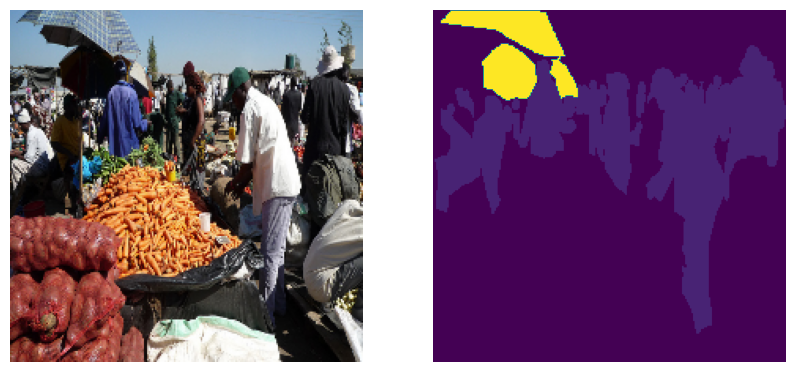

In [ ]:
#Let's test it

X, y = read_img(train_images[0], 'train')

plt.style.use('default')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
ax[0].imshow(X)
ax[1].imshow(y[:,:,0])
ax[0].axis('off')
ax[1].axis('off')
plt.show()

### Naive Approach

I created this generator that would fetch batches of images from the disk and then will train the tensorflow model. The training time through this generator was 1 hour per epoch because of various steps involved in mask generation.

In [ ]:
"""
This generator will create batches of images to be fed into the tensorflow models
"""

def generate_naive(batch_size, l, mode = 'train'): #l - list of dictionary files
    c = 0

    while(True): #Infinite Generator
        X = np.zeros((batch_size, 224, 224, 3)).astype('float')
        y = np.zeros((batch_size, 224, 224, 26)).astype('float')
        
        for i in range(c, c+batch_size):
            img, mask = read_img(l[i], data=mode)
            
            if img.shape[-1] == 1:
            #If Image is in grayscale, repeat it across channels:
                img = np.repeat([img],3, axis=-1)

            X[i-c] = img
            y[i-c] = tf.keras.utils.to_categorical(mask, 26)
        c += batch_size
        
        if (c + batch_size >= len(l)):
            c = 0
            random.shuffle(l)
        
        yield X, y

#Our Generators
train_generator = generate_naive(32, train_images[:57023], 'train') #Selecting only 57023 images
val_generator = generate_naive(32, val_images, 'val')

In [ ]:
#Testing these
for X, y in train_generator:
    break
print(X.shape)
print(y.shape)

(32, 224, 224, 3)
(32, 224, 224, 26)


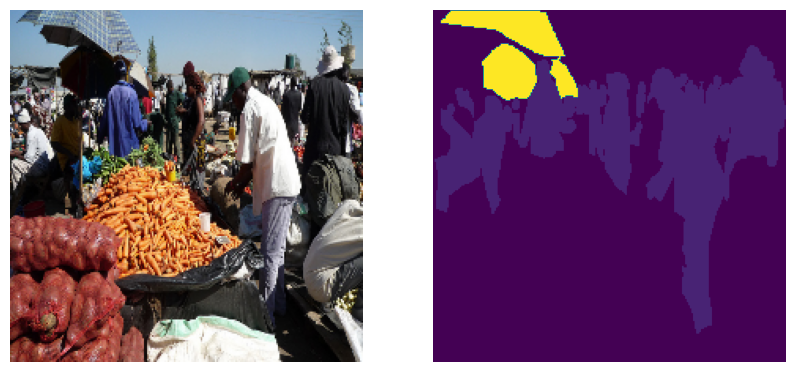

In [ ]:
#Let's test it

plt.style.use('default')
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))
ax[0].imshow(X[0].astype('uint8')) #Generator converts images to float so that neural network can process it
ax[1].imshow(np.argmax(y[0,:,:], axis=-1).astype('uint8')) #Generator returns one-hot encoded masks, we're converting it back to label to visualize it
ax[0].axis('off')
ax[1].axis('off')
plt.show()

### Improvised Approach: Saving batches of Images and Masks as NPY files and then creating a generator to read those files

Using this method, I eliminated the time taking steps in mask generation and I could just read the entire batch of images and masks as npy file and pass it on to the tensorflow model. This resulted in a training time of 15 minutes per epoch. I used uint8 format to reduce the disk storage as it takes only one byte per element of the array.

I created a dataset on kaggle after generating these files of batch size 32 and for model building I directly imported from that dataset.

(It's a private dataset that can only be opened via this link)
Kaggle dataset link: https://kaggle.com/datasets/c152647705543f7dd00d4d9534cb2f0707aa6ba61e7c8a471e97578079462031



In [ ]:
#Making Folders for storing npy files
!mkdir train
!mkdir train/images
!mkdir train/masks

!mkdir val
!mkdir val/images
!mkdir val/masks

In [ ]:
"""
Creating Numpy Arrays for Training Images
"""

count = 0
gray = 0
channels = 0
output_dir = "train/"
n_batches = 1
c=0
b_size=32

pbar = ProgressBar()

#Create batches of 57023 images - batch size of 32. 
#This means 1782 batches
for image_d in pbar(train_images):
    im, mask = read_img(image_d, 'train')
    
    mask = mask.astype('uint8')
    im = im.astype('uint8')
    
    #Skip the images that are already in grayscale
    if len(im.shape) < 3:
        gray += 1
        continue
        
    if c == 0 and count > 57023:#Break the loop once we've reached our count
        break
    
    count += 1
    
    #Creating array
    if c == 0:
        Z_img = np.zeros((b_size, 224, 224, 3))
        Z_mask = np.zeros((b_size, 224, 224, 1))
    
    #Append into the array
    Z_img[c] = im
    Z_mask[c] = mask
    c+=1
    
    #Save the array once we've filled all batch_size images
    if c == b_size:
        np.save(output_dir+f"img_b_{n_batches}",Z_img.astype('uint8'))
        np.save(output_dir+f"mask_b_{n_batches}",Z_mask.astype('uint8'))
        n_batches += 1
        c=0
        
print('Images Generated: ', count)
print('Grayscale Skip: ', gray)
print('Classes Skip: ', channels)

 60% (57152 of 95037) |##########        | Elapsed Time: 0:48:06 ETA:   0:36:05

Images Generated:  57024
Grayscale Skip:  128
Classes Skip:  0


In [ ]:
"""
Creating Numpy Arrays for Validation Images
"""

count = 0
gray = 0
channels = 0
output_dir = "val/"
n_batches = 1
c=0
b_size=32

pbar = ProgressBar()

for image_d in pbar(val_images):
    im, mask = read_img(image_d, 'val')
    
    mask = mask.astype('uint8')
    im = im.astype('uint8')
    
    #Skip the images that are already in grayscale
    if len(im.shape) < 3:
        gray += 1
        continue
    
    count += 1
    
    #Creating array
    if c == 0:
        Z_img = np.zeros((b_size, 224, 224, 3))
        Z_mask = np.zeros((b_size, 224, 224, 1))
    
    #Append into the array
    Z_img[c] = im
    Z_mask[c] = mask
    c+=1
    
    #Save the array once we've filled all batch_size images
    if c == b_size:
        np.save(output_dir+f"img_b_{n_batches}",Z_img.astype('uint8'))
        np.save(output_dir+f"mask_b_{n_batches}",Z_mask.astype('uint8'))
        n_batches += 1
        c=0

print('Images Generated: ', count)
print('Grayscale Skip: ', gray)
print('Classes Skip: ', channels)

100% (4027 of 4027) |####################| Elapsed Time: 0:03:09 Time:  0:03:09


Images Generated:  4017
Grayscale Skip:  10
Classes Skip:  0


In [ ]:
#Number of Batches
train_batches = 1782
val_batches = 125

def generate_batches(mode='train'):
    
    if mode == 'train':
        limit = train_batches
        directory = "/content/train"
    elif mode == 'val':
        limit = val_batches
        directory = "/content//val"
    
    c = 0
    
    l = list(range(1, limit+1))
    
    random.shuffle(l)#Randomly pick batches
    
    while True: #Infinite Loop
        X = np.load(directory+f"/img_b_{l[c]}.npy")
        y = np.load(directory+f"/mask_b_{l[c]}.npy")
        c += 1
        
        if c == limit:
            c = 0
            random.shuffle(l)
        
        X = X.astype('float32')/255 #Normalize
        y = tf.keras.utils.to_categorical(y, 26)
        
        yield X, y
    
#Our New Generators
train_generator = generate_batches(mode='train')
val_generator = generate_batches(mode='val')

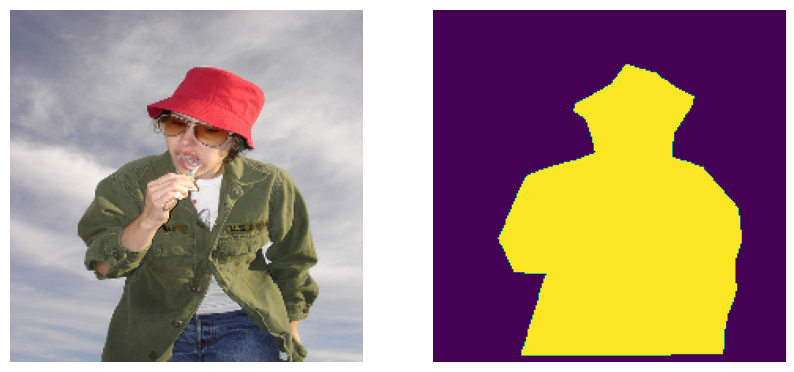

In [ ]:
#Testing the generator

for x, y in train_generator:
    break

#Plotting the first image of the batch
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

ax[0].imshow(x[0])
ax[0].axis('off')

ax[1].imshow(np.argmax(y[0], axis=-1))
ax[1].axis('off')

plt.show()

# Model Building

In [ ]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, Activation, ReLU
from tensorflow.keras.layers import BatchNormalization, Conv2DTranspose, Concatenate, Dropout
from tensorflow.keras.models import Model, Sequential

import h5py
!pip install segmentation_models
import segmentation_models as sm
sm.set_framework('tf.keras')

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 KB 5.3 MB/s eta 0:00:00
Segmentation Models: using `keras` framework.


## Base Model created from scratch
For my base model, I picked a U-Net architecture as prof. Nigam mentioned during the class that U-Nets are highly effective at image segmentation.

In [ ]:
"""
Our Base Model
"""

inputs = Input(shape=(224,224,3))

#Block1
b1_conv1 = Conv2D(32, 
              3,   # Kernel size   
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(inputs)
b1_conv2 = Conv2D(32, 
              3,   # Kernel size
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b1_conv1)
b1_bn = BatchNormalization()(b1_conv2, training=False)
b1_dr = Dropout(0.1)(b1_bn)
b1_mp = MaxPooling2D(pool_size = (2,2))(b1_dr)

#Block2
b2_conv1 = Conv2D(64, 
              3,   # Kernel size   
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b1_mp)
b2_conv2 = Conv2D(64, 
              3,   # Kernel size
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b2_conv1)
b2_bn = BatchNormalization()(b2_conv2, training=False)
b2_dr = Dropout(0.1)(b2_bn)
b2_mp = MaxPooling2D(pool_size = (2,2))(b2_dr)

#Block 3
b3_conv1 = Conv2D(128, 
              3,   # Kernel size   
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b2_mp)
b3_conv2 = Conv2D(128, 
              3,   # Kernel size
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b3_conv1)
b3_bn = BatchNormalization()(b3_conv2, training=False)
b3_dr = Dropout(0.1)(b3_bn)
b3_mp = MaxPooling2D(pool_size = (2,2))(b3_dr)

#Block 4
b4_conv1 = Conv2D(256, 
              3,   # Kernel size   
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b3_mp)
b4_conv2 = Conv2D(256, 
              3,   # Kernel size
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b4_conv1)
b4_bn = BatchNormalization()(b4_conv2, training=False)
b4_dr = Dropout(0.3)(b4_bn)
b4_mp = MaxPooling2D(pool_size = (2,2))(b4_dr)

#Block 5
b5_conv1 = Conv2D(512, 
              3,   # Kernel size   
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b4_mp)
b5_conv2 = Conv2D(512, 
              3,   # Kernel size
              activation='relu',
              padding='same',
              kernel_initializer='HeNormal')(b5_conv1)
b5_bn = BatchNormalization()(b5_conv2, training=False)
b5_dr = Dropout(0.3)(b5_bn)

#Decoder blocks - 4

#Block 6
b6_up = Conv2DTranspose(
             256,
             (3,3),    # Kernel size
             strides=(2,2),
             padding='same')(b5_bn)
b6_concat = Concatenate(axis=3)([b6_up, b4_dr])
b6_conv1 = Conv2D(256, 
             3,     # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b6_concat)
b6_conv2 = Conv2D(256,
             3,   # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b6_conv1)

#Block 7
b7_up = Conv2DTranspose(
             128,
             (3,3),    # Kernel size
             strides=(2,2),
             padding='same')(b6_conv2)
b7_concat = Concatenate(axis=3)([b7_up, b3_dr])
b7_conv1 = Conv2D(128, 
             3,     # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b7_concat)
b7_conv2 = Conv2D(128,
             3,   # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b7_conv1)

#Block 8
b8_up = Conv2DTranspose(
             64,
             (3,3),    # Kernel size
             strides=(2,2),
             padding='same')(b7_conv2)
b8_concat = Concatenate(axis=3)([b8_up, b2_dr])
b8_conv1 = Conv2D(64, 
             3,     # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b8_concat)
b8_conv2 = Conv2D(64,
             3,   # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b8_conv1)

#Block 9
b9_up = Conv2DTranspose(
             32,
             (3,3),    # Kernel size
             strides=(2,2),
             padding='same')(b8_conv2)
b9_concat = Concatenate(axis=3)([b9_up, b1_dr])
b9_conv1 = Conv2D(32, 
             3,     # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b9_concat)
b9_conv2 = Conv2D(32,
             3,   # Kernel size
             activation='relu',
             padding='same',
             kernel_initializer='HeNormal')(b9_conv1)

#Final Layers to get to the output

conv10 = Conv2D(32,
             3,
             activation='relu',
             padding='same',
             kernel_initializer='he_normal')(b9_conv2)
conv11 = Conv2D(26, 1, padding='same')(conv10)

base_model = Model(inputs=inputs, outputs=conv11)

In [ ]:
base_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 224, 224, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_1 (Conv2D)              (None, 224, 224, 32  9248        ['conv2d[0][0]']                 
                                )                                                             

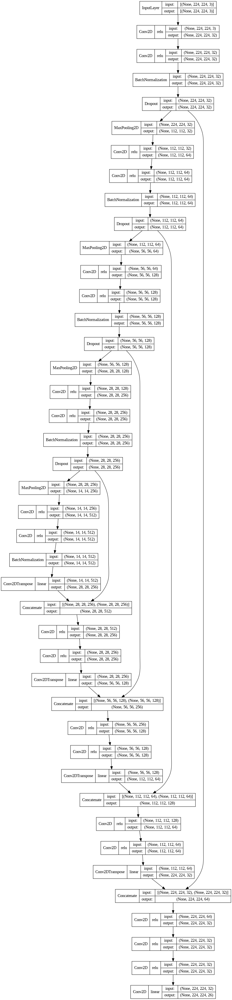

In [ ]:
#Visualizing the model
tf.keras.utils.plot_model(base_model, show_shapes=True, show_layer_activations=True, show_layer_names=False, rankdir = 'TB')

In [ ]:
"""
For this model, we're using a combination of Focal loss and Dice Loss. 
Jaccard Loss didn't perform well, this could be because the dataset is heavily imbalanced. In such cases, Focal Loss works better.
"""

base_model.compile(optimizer='adam',
          loss =  sm.losses.CategoricalFocalLoss() + sm.losses.DiceLoss(),
         metrics=['accuracy', sm.metrics.IOUScore()])

In [ ]:

#Training the model

"""
n_epochs = 30 #I trained it for 30 epochs

history1 = base_model.fit(train_generator, validation_data=val_generator,
                             steps_per_epoch = train_batches,
                             validation_steps = val_batches,
                             epochs=n_epochs,
                             verbose=True
                   )

base_model.save_weights('model-scratch.h5')
pd.DataFrame(history1.history).to_csv('training-scratch.csv')
"""
#We'll load the weights directly for now

!gdown 1ng_qTuCELeUx14_dD9ZVVA-ke5EIoj2c #Model Weights
!gdown 1tL0WPRZziKU_-OcOVSBp91-JQgmsLyO4 #Training csv

base_model.load_weights('model-scratch.h5')
base_train = pd.read_csv('training-scratch.csv')

Downloading...
From: https://drive.google.com/uc?id=1ng_qTuCELeUx14_dD9ZVVA-ke5EIoj2c
To: /content/model-scratch.h5
100% 34.7M/34.7M [00:00<00:00, 91.8MB/s]
Downloading...
From: https://drive.google.com/uc?id=1tL0WPRZziKU_-OcOVSBp91-JQgmsLyO4
To: /content/training-scratch.csv
100% 3.70k/3.70k [00:00<00:00, 4.94MB/s]


In [ ]:
base_train.columns = ['Epoch', 'loss', 'accuracy', 'iou_score', 'val_loss',
       'val_accuracy', 'val_iou_score']
base_train['Epoch'] += 1

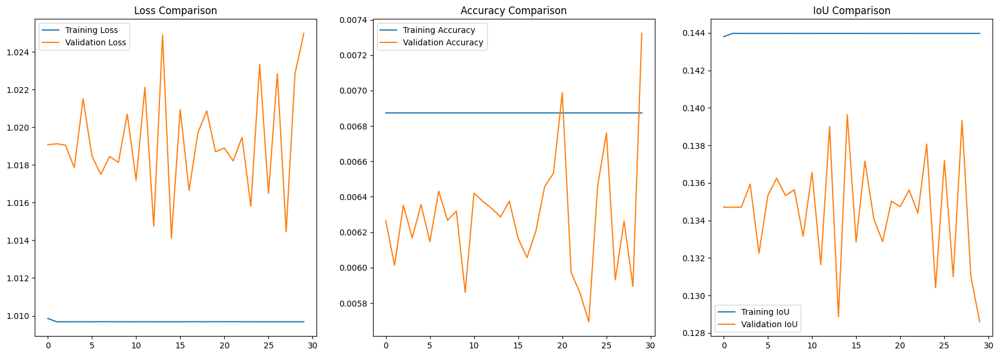

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(21,7))

ax[0].set_title('Loss Comparison')
ax[0].plot(base_train['loss'], label='Training Loss')
ax[0].plot(base_train['val_loss'], label='Validation Loss')
ax[0].legend()

ax[1].set_title('Accuracy Comparison')
ax[1].plot(base_train['accuracy'], label='Training Accuracy')
ax[1].plot(base_train['val_accuracy'], label='Validation Accuracy')
ax[1].legend()

ax[2].set_title('IoU Comparison')
ax[2].plot(base_train['iou_score'], label='Training IoU')
ax[2].plot(base_train['val_iou_score'], label='Validation IoU')
ax[2].legend()

The training process for this model remained chaotic. This could be because of class imbalance, as we only took some classes, the rest of the classes were labelled as background. It may have trained better if we took all the classes, this was the reason why I used colour images instead of grayscale images. Moreover, image segmentation requires heavy training and due to limited computational resources, I could only train it for 30 epochs.

In [ ]:
#Final Stats

base_train.loc[[0, 4, 9, 14, 24, 29]]

,Epoch,loss,accuracy,iou_score,val_loss,val_accuracy,val_iou_score
0,1,1.009855,0.006874,0.143798,1.019066,0.006265,0.134707
4,5,1.009681,0.006874,0.143972,1.021507,0.006356,0.132249
9,10,1.009681,0.006874,0.143972,1.020699,0.005860,0.133152
14,15,1.009681,0.006874,0.143972,1.014117,0.006375,0.139634
24,25,1.009681,0.006874,0.143972,1.023326,0.006461,0.130408
29,30,1.009680,0.006874,0.143972,1.024978,0.007323,0.128593


## U-Net Model created with Resnet-18 encoder blocks and weights pre-trained on imagenet
To make the process easier, I imported this model from segmentation_models library. U-Net with resnet18 backbone had fewer weights than vgg16 and any other backbone, due to this reason I picked resnet18

In [ ]:
model = sm.Unet(backbone_name = 'resnet18',
                                encoder_weights = 'imagenet', #Transfer learning
                                input_shape = (224,224,3),
                                classes=26,
                                activation='softmax')

44920640/44920640 [==============================] - 3s 0us/step


In [ ]:
model.summary()

Model: "model_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 data (InputLayer)              [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 bn_data (BatchNormalization)   (None, 224, 224, 3)  9           ['data[0][0]']                   
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, 230, 230, 3)  0          ['bn_data[0][0]']                
                                                                                                  
 conv0 (Conv2D)                 (None, 112, 112, 64  9408        ['zero_padding2d[0][0]']   

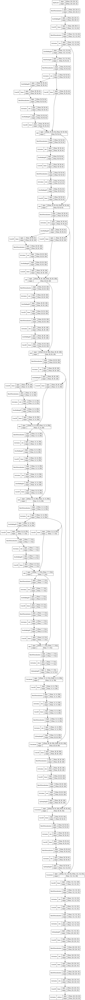

In [ ]:
tf.keras.utils.plot_model(model, show_shapes=True, show_layer_activations=True, show_layer_names=False, rankdir = 'TB')

In [ ]:
"""
In this case, the weights of the encoder are pre-trained to extract features from images, we eventually want to minimize our IoU so we're using Jaccard Loss and Focal Loss here
"""

model.compile(optimizer='adam',
          loss = sm.losses.JaccardLoss() + sm.losses.CategoricalFocalLoss(), 
         metrics=['accuracy', sm.metrics.IOUScore()])

In [ ]:
#Training the model

"""
n_epochs = 40 #I trained this for 40 epochs

history2 = model.fit(train_generator, validation_data=val_generator,
                             steps_per_epoch = train_batches,
                             validation_steps = val_batches,
                             epochs=n_epochs,
                             verbose=True
                   )
model.save_weights('sm Model.h5')
pd.DataFrame(history1.history).to_csv('Training_Track.csv')
"""
#We'll load the weights directly for now

!gdown "1YU5oBBk2z_nFxH4dgxiPiDNtNiYI5oml&confirm=t" #Weights at Epochs 1, 5, 10, 15, 20
!unzip weights.zip

!gdown 1vv0GJhvXT5RAvH-Fw_AEXyldyqX2eP1H #Model Weights - Final Epoch 40
!gdown 1H62K104Os_2PddFueOHfoh-G2ngnSM-k #Training csv

# model.load_weights('model-sm.h5')
model_train = pd.read_csv('training-sm.csv')

Downloading...
From: https://drive.google.com/uc?id=1YU5oBBk2z_nFxH4dgxiPiDNtNiYI5oml&confirm=t
To: /content/weights.zip
100% 781M/781M [00:03<00:00, 241MB/s]
Archive:  weights.zip
  inflating: 15.h5                   
  inflating: 01.h5                   
  inflating: 05.h5                   
  inflating: 10.h5                   
  inflating: 20.h5                   
Downloading...
From: https://drive.google.com/uc?id=1vv0GJhvXT5RAvH-Fw_AEXyldyqX2eP1H
To: /content/model-sm.h5
100% 57.6M/57.6M [00:00<00:00, 152MB/s]
Downloading...
From: https://drive.google.com/uc?id=1H62K104Os_2PddFueOHfoh-G2ngnSM-k
To: /content/training-sm.csv
100% 4.75k/4.75k [00:00<00:00, 5.63MB/s]


In [ ]:
model_train.columns = ['Epoch', 'loss', 'accuracy', 'iou_score', 'val_loss',
       'val_accuracy', 'val_iou_score']
model_train['Epoch'] += 1

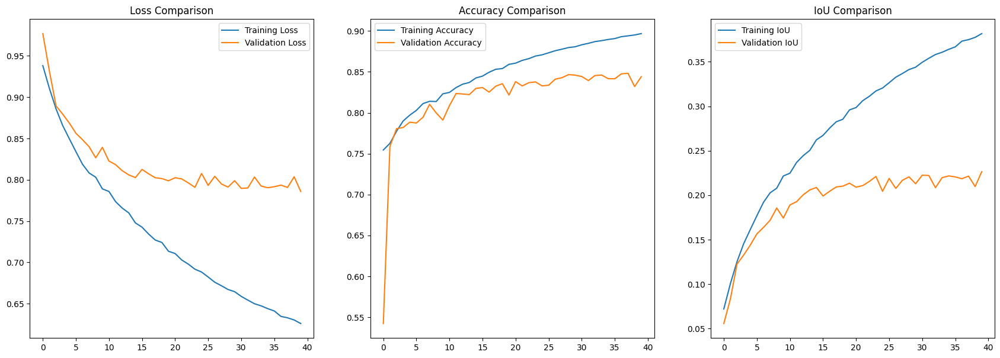

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(21,7))

ax[0].set_title('Loss Comparison')
ax[0].plot(model_train['loss'], label='Training Loss')
ax[0].plot(model_train['val_loss'], label='Validation Loss')
ax[0].legend()

ax[1].set_title('Accuracy Comparison')
ax[1].plot(model_train['accuracy'], label='Training Accuracy')
ax[1].plot(model_train['val_accuracy'], label='Validation Accuracy')
ax[1].legend()

ax[2].set_title('IoU Comparison')
ax[2].plot(model_train['iou_score'], label='Training IoU')
ax[2].plot(model_train['val_iou_score'], label='Validation IoU')
ax[2].legend()

plt.show()

The training process for this model looks much more smoother. Encoder weights(resnet18) were pretrained to extract some features and that transfer learning helped our model to adapt to our dataset.

In [ ]:
#Final Stats

model_train.loc[[0, 4, 9, 14, 24, 29]]

,Epoch,loss,accuracy,iou_score,val_loss,val_accuracy,val_iou_score
0,1,0.938179,0.754470,0.072151,0.976963,0.542306,0.055780
4,5,0.849834,0.797097,0.161371,0.868782,0.788480,0.143924
9,10,0.789044,0.823163,0.221626,0.839274,0.791056,0.174357
14,15,0.747792,0.842561,0.262243,0.802643,0.829767,0.208701
24,25,0.688392,0.870843,0.320531,0.807633,0.832871,0.204413
29,30,0.664571,0.880680,0.343923,0.798935,0.846015,0.212916


# Generating images

In [ ]:
np.random.seed(42)

In [ ]:
def plot_images(d, mode):
    X, y = read_img(d, mode)
    
    if len(X.shape) < 3:
        X = np.expand_dims(X, axis=-1)
        X = np.repeat([X], 3, -1)
        X = X[0]

    X = np.expand_dims(X, 0)/255 #Normalize the Image
    y = y[:,:,0]

    fig, ax = plt.subplots(nrows=1, ncols=8, figsize=(40,5))
    ax[0].imshow(X[0])
    ax[0].set_title('Image')
    ax[0].axis('off')
    ax[1].imshow(y)
    ax[1].set_title('Real')
    ax[1].axis('off')

    c = 2
    for i in ["01.h5", "05.h5", "10.h5", "15.h5", "20.h5", "model-sm.h5"]:
        model.load_weights(i)
        y_pred = model(X)
        y_pred = np.argmax(y_pred, axis=-1)[0]
        ax[c].imshow(y_pred)
        if i == "model-sm.h5":
            ax[c].set_title("Epoch 40")
        else:
            ax[c].set_title("Epoch "+i[:2])
        ax[c].axis('off')
        c+=1
    plt.show()

In [ ]:
train_img_dicts = np.random.choice(train_images, size=10, replace=False)
val_img_dicts = np.random.choice(val_images, size=10, replace=False)

(1, 224, 224, 3)


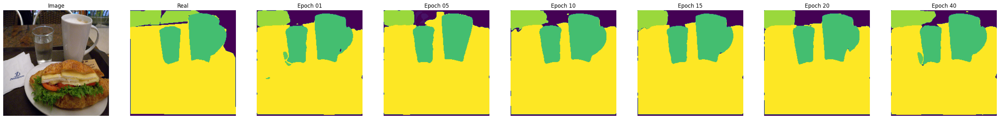

(1, 224, 224, 3)


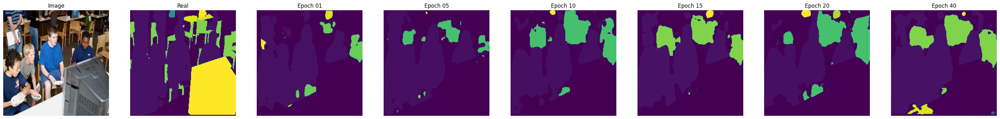

(1, 224, 224, 3)


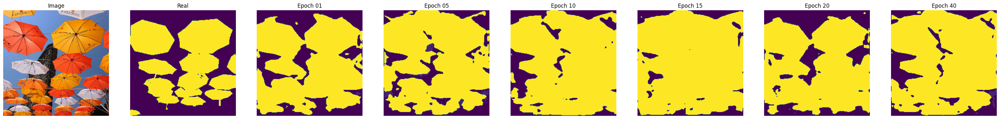

(1, 224, 224, 3)


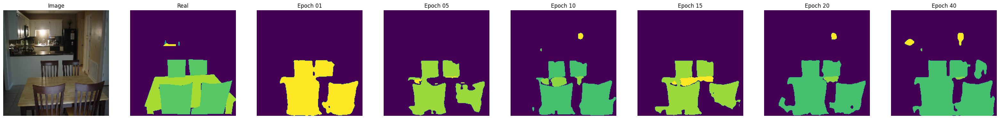

(1, 224, 224, 3)


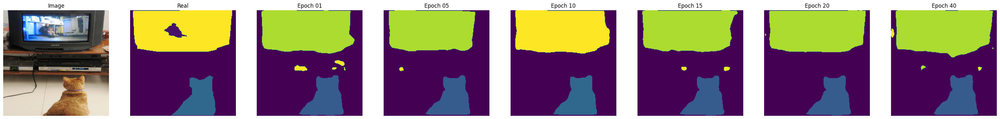

(1, 224, 224, 3)


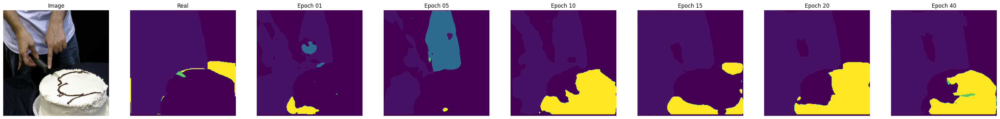

(1, 224, 224, 3)


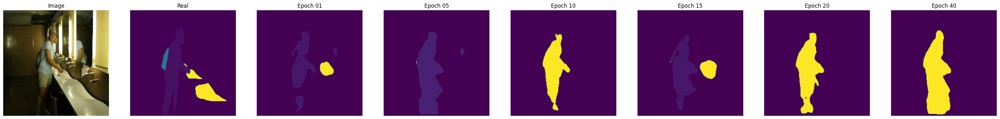

(1, 224, 224, 3)


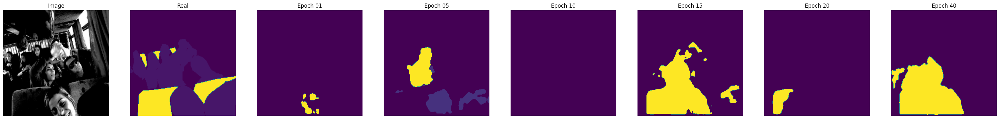

(1, 224, 224, 3)


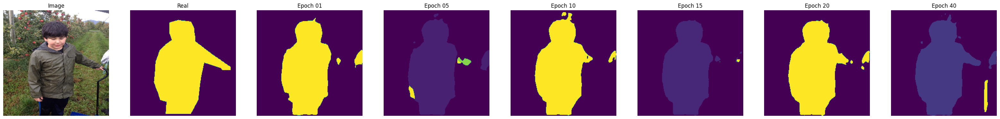

(1, 224, 224, 3)


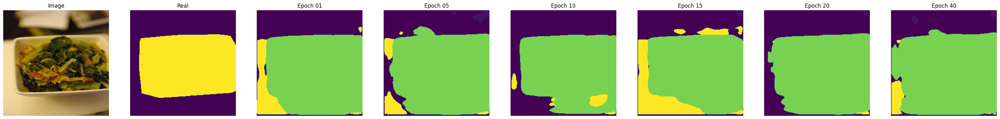

In [ ]:
#Training images
for img_dicts in train_img_dicts:
    plot_images(img_dicts, 'train')

(1, 224, 224, 3)


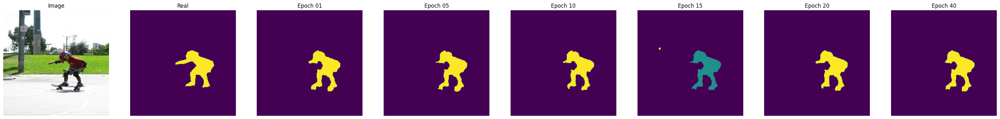

(1, 224, 224, 3)


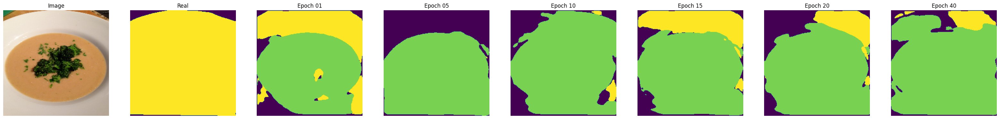

(1, 224, 224, 3)


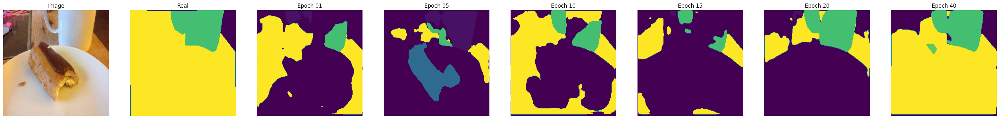

(1, 224, 224, 3)


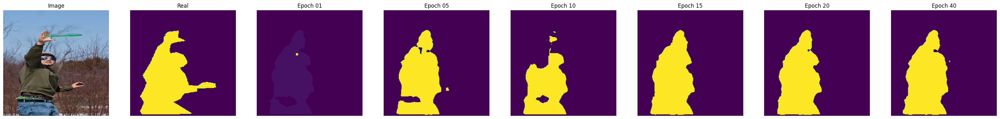

(1, 224, 224, 3)


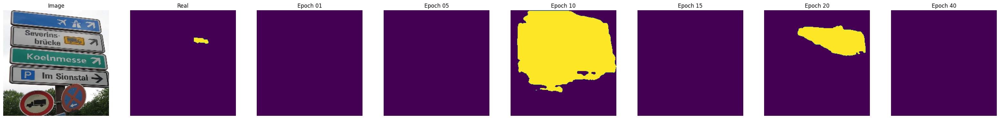

(1, 224, 224, 3)


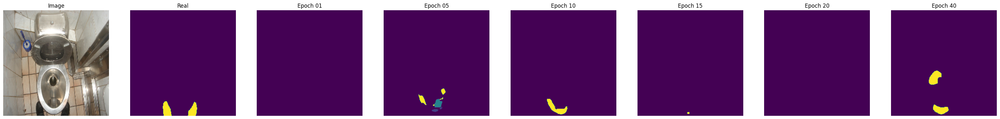

(1, 224, 224, 3)


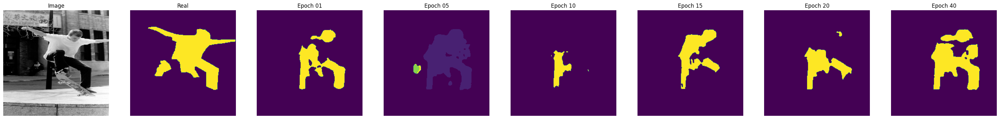

(1, 224, 224, 3)


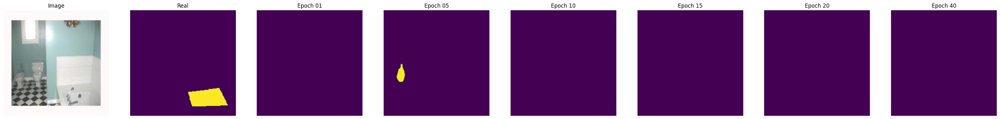

(1, 224, 224, 3)


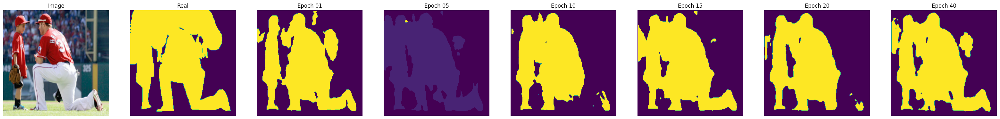

(1, 224, 224, 3)


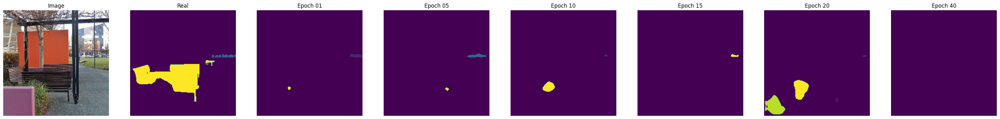

In [ ]:
#Validation images
for img_dicts in val_img_dicts:
    plot_images(img_dicts, 'val')

In [ ]:
#For mentioning Objects
classes = ['background']+classes

In [ ]:
#Randomly selecting Test Images
import os
test_files = os.listdir("/content/test2017")
test_img_ids = np.random.choice(test_files, size=10, replace=False)

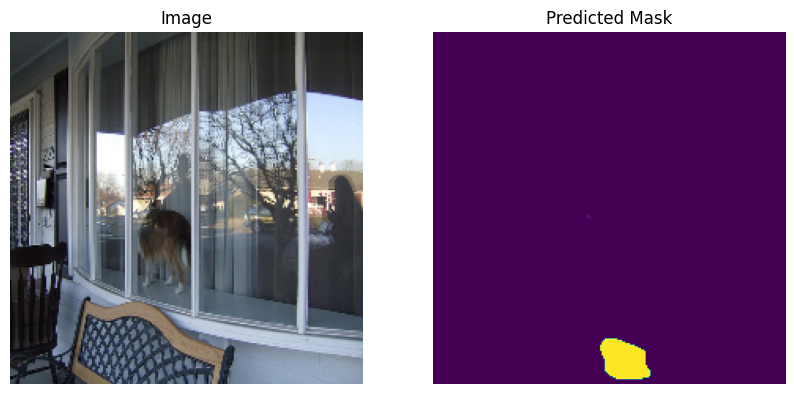

Unique Values in the above Mask:  [ 0  1 17]
Objects in the above Mask:  ['background', 'person', 'chair']





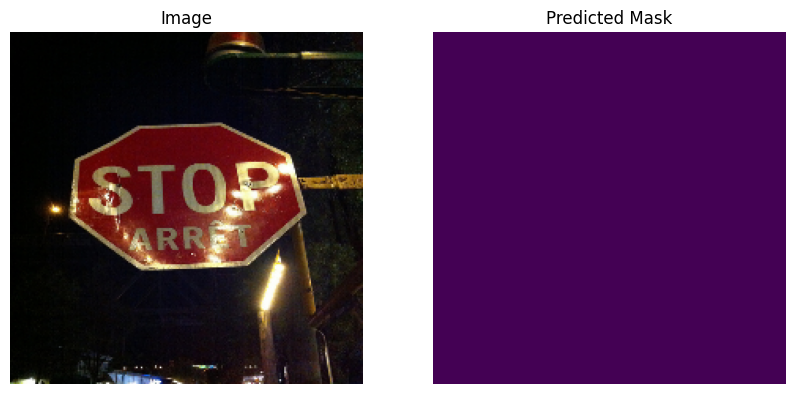

Unique Values in the above Mask:  [0]
Objects in the above Mask:  ['background']





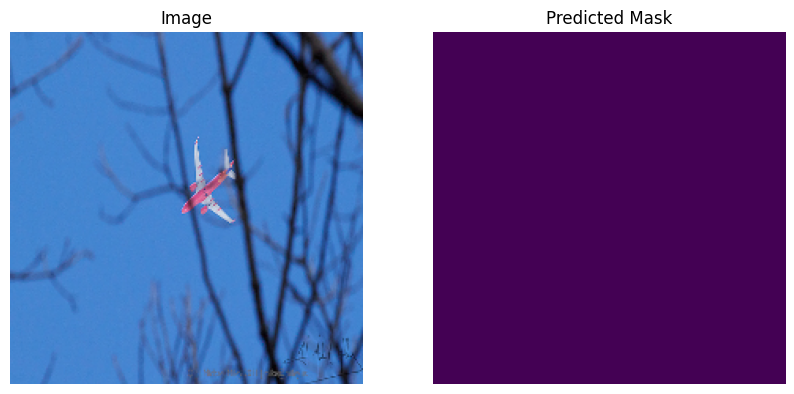

Unique Values in the above Mask:  [0]
Objects in the above Mask:  ['background']





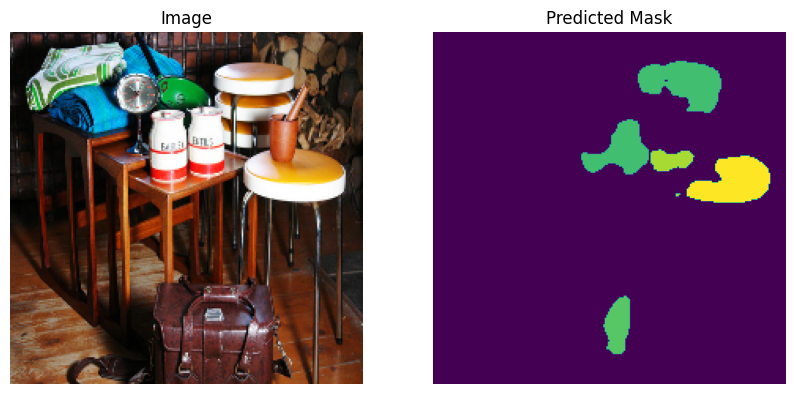

Unique Values in the above Mask:  [ 0 16 17 20 23]
Objects in the above Mask:  ['background', 'bowl', 'chair', 'dining table', 'sink']





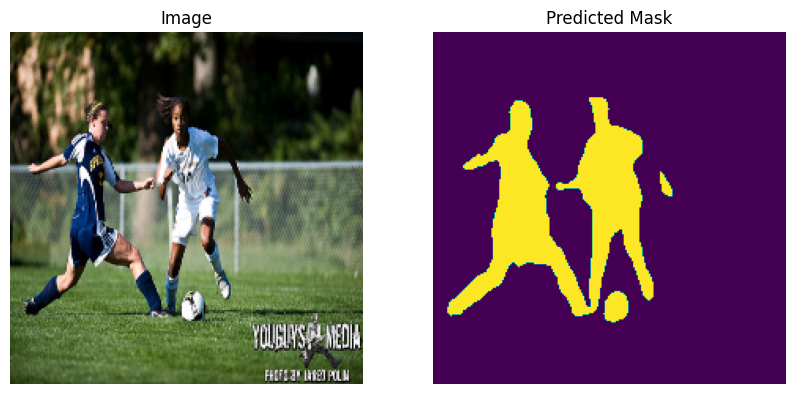

Unique Values in the above Mask:  [0 1]
Objects in the above Mask:  ['background', 'person']





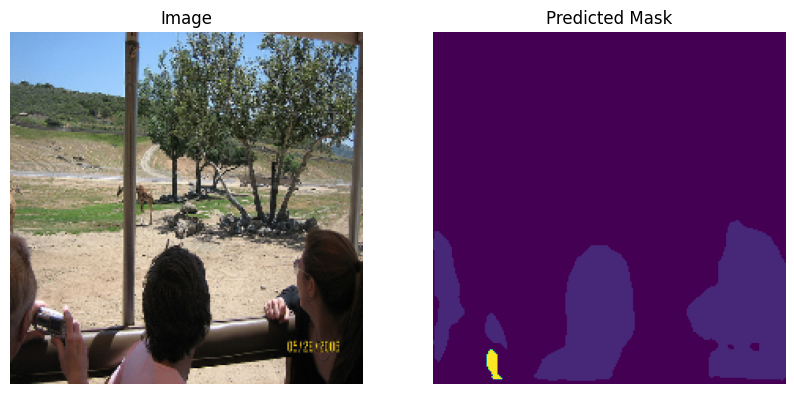

Unique Values in the above Mask:  [0 1 9]
Objects in the above Mask:  ['background', 'person', 'backpack']





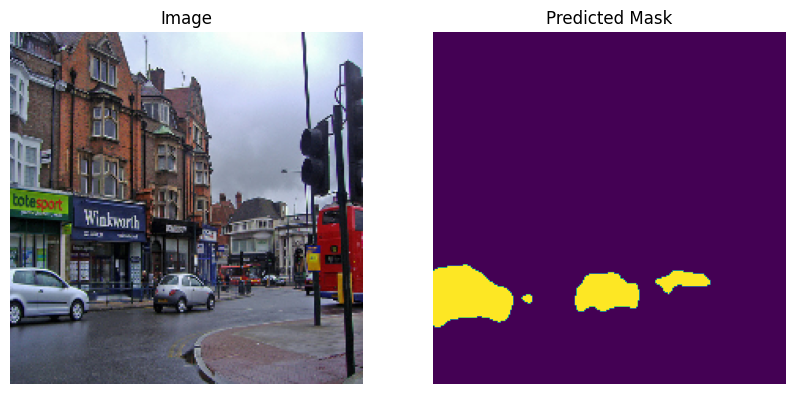

Unique Values in the above Mask:  [0 2]
Objects in the above Mask:  ['background', 'car']





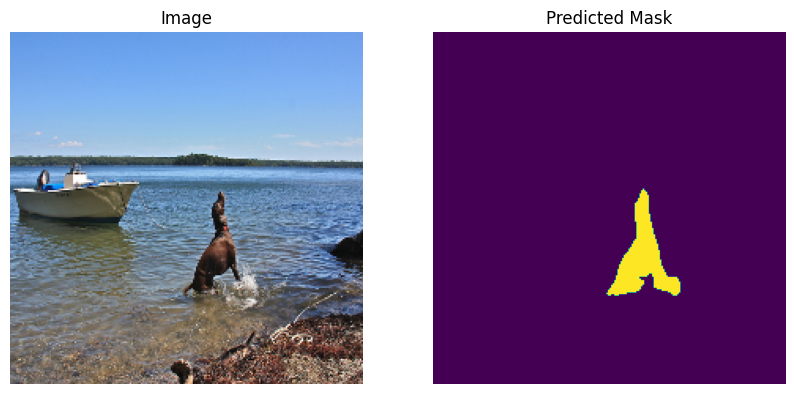

Unique Values in the above Mask:  [0 1]
Objects in the above Mask:  ['background', 'person']





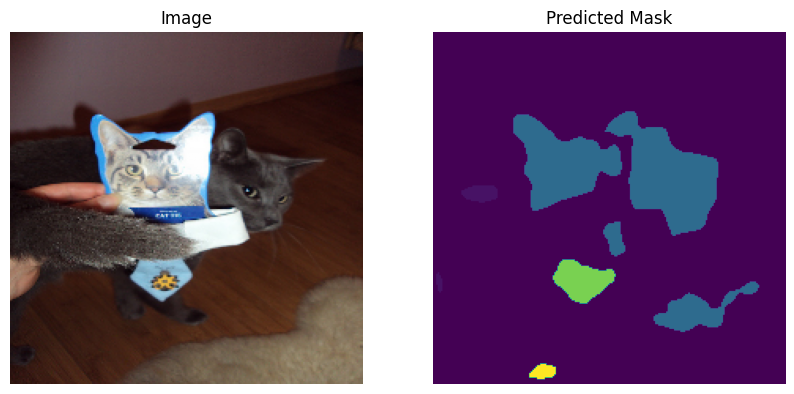

Unique Values in the above Mask:  [ 0  1  7 16 20]
Objects in the above Mask:  ['background', 'person', 'cat', 'bowl', 'dining table']





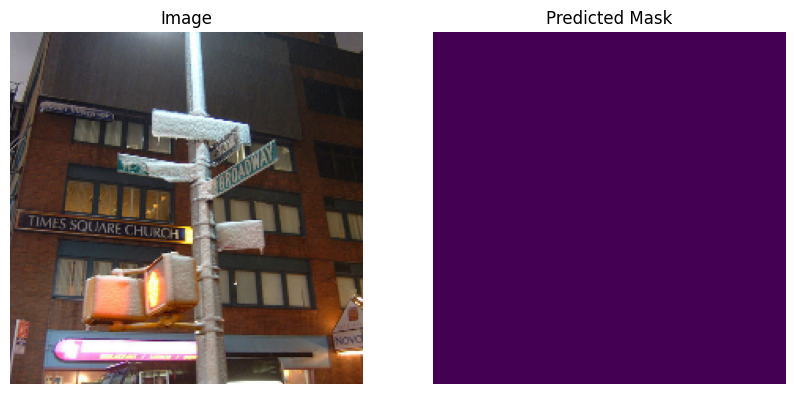

Unique Values in the above Mask:  [0]
Objects in the above Mask:  ['background']





In [ ]:
model.load_weights("10.h5")

for img_id in test_img_ids:
    img = io.imread("/content/test2017/"+img_id)
    img = cv2.resize(img, (224,224)) / 255

    #Fetching Predictions
    img = np.expand_dims(img, 0)

    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10,5))

    ax[0].imshow(img[0])
    ax[0].set_title('Image')
    ax[0].axis('off')

    y_pred = model(img)
    y_pred = np.argmax(y_pred, axis=-1)[0]
    ax[1].imshow(y_pred)
    ax[1].set_title("Predicted Mask")
    ax[1].axis('off')
    plt.show()
    print("Unique Values in the above Mask: ", np.unique(y_pred))
    print("Objects in the above Mask: ", [classes[x] for x in np.unique(y_pred)])
    print("\n\n")
